# Autolabeling Correction

In [1]:
from IPython.display import clear_output
import time 

#for i in range(10):
#    clear_output(wait=True)
#    print(i)
#    time.sleep(1)

In [2]:
print("start")

start


In [3]:
import geopandas
import rasterio
import matplotlib.pyplot as plt
from shapely.geometry import Point
from rasterio.plot import show

import datetime as dt
import pandas as pd

import numpy as np
import glob, os

# make sure we're dealing with the most recent version of any code we're using
#%load_ext autoreload
#%autoreload 2

#from readers.get_ATL10 import get_ATL10data
#from readers.getATL07 import get_ATL07

In [4]:
def del_last_first_chunk(df_file):
    corner_offset = 100
    # Identify the last continuous chunk of `2`s
    last_chunk_start = None
    in_chunk = False

    for i in range(len(df_file) - 1, -1, -1):
        if df_file.loc[i, 'label'] == 2.0 and not in_chunk:
            # Found the start of a potential chunk at the end
            last_chunk_start = i
            in_chunk = True
        elif df_file.loc[i, 'label'] != 2.0 and in_chunk:
            # We've reached a non-2, so we know the last chunk starts right after this index
            last_chunk_start = i + 1
            break

    # Drop the rows of the last chunk if it exists
    if last_chunk_start is not None:
        df_file = df_file.drop(df_file.index[last_chunk_start-corner_offset:])

    # Identify the first chunk of rows where 'A' == 2
    first_chunk_end = None
    for i in range(len(df_file)):
        if df_file.loc[i, 'label'] != 2.0:  # End of the first chunk
            first_chunk_end = i
            break

    # Drop the first chunk if it exists
    if first_chunk_end is not None:
        df_file = df_file.drop(df_file.index[:first_chunk_end+corner_offset])
    
    return df_file

In [5]:
# from rembg import remove
# import cv2
# import time

# #file = 's2_tiff/test_tiffs/s2_vis_04_20191104T194529_20191104T194523_T02CNA.tif'
# #file = 's2_tiff/test_tiffs/s2_vis_05_20191104T194529_20191104T194523_T02CNB.tif'
# #file = 's2_tiff/test_tiffs/s2_vis_06_20191104T194529_20191104T194523_T02CNC.tif'

# t0 = time.time()

# img = rasterio.open(file, crs = 'EPSG:3976')

# raw = img.read(1)
# raw[raw < 0] = 0

# ori = img.read()
# ori[ori < 0] = 0
# ori = ori.swapaxes(0,1)
# ori = ori.swapaxes(1,2)

# file_name = "ATL03_labeled_data/ow_labeled_by_is2trackline_10m/good/ATL03_20191126182014_09290510_T03CWT_gt2r_labeled_10m.csv"
# print(file_name)
# name = file_name[-57:]
# print(name)

# df_file = pd.read_csv(file_name)

# df_file = del_last_first_chunk(df_file)

# # Reset the index after dropping rows
# df_file = df_file.reset_index(drop=True)
# # df_file = df_file.loc[:, ~df_file.columns.str.contains('Unnamed.')]
# # Drop the first occurrence of 'Unnamed: 0.1'
# df_file = df_file.drop(columns=['Unnamed: 0.1'], errors='ignore')
# # Rename 'Unnamed: 0' to 'idx'
# df_file = df_file.rename(columns={'Unnamed: 0': 'Ori_Id'})

# print(df_file)
# df_file.to_csv("ATL03_labeled_data/cor_labeled_by_is2trackline_10m/"+name)


ATL03_labeled_data/ow_labeled_by_is2trackline_10m/good/ATL03_20191123180255_08830510_T04CEA_gt3r_labeled_10m.csv
ATL03_20191123180255_08830510_T04CEA_gt3r_labeled_10m.csv
       Unnamed: 0.1  Unnamed: 0  year  month  day  hour  minute  second  \
0            106230      106230  2019     11   23    18      10       0   
1            106231      106231  2019     11   23    18      10       0   
2            106232      106232  2019     11   23    18      10       0   
3            106233      106233  2019     11   23    18      10       0   
4            106234      106234  2019     11   23    18      10       0   
...             ...         ...   ...    ...  ...   ...     ...     ...   
56043        162273      162273  2019     11   23    18      10      16   
56044        162274      162274  2019     11   23    18      10      16   
56045        162275      162275  2019     11   23    18      10      16   
56046        162276      162276  2019     11   23    18      10      16   
5604

/tmp/ipykernel_1197039/97294409.py:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = (16,16), dpi=500)


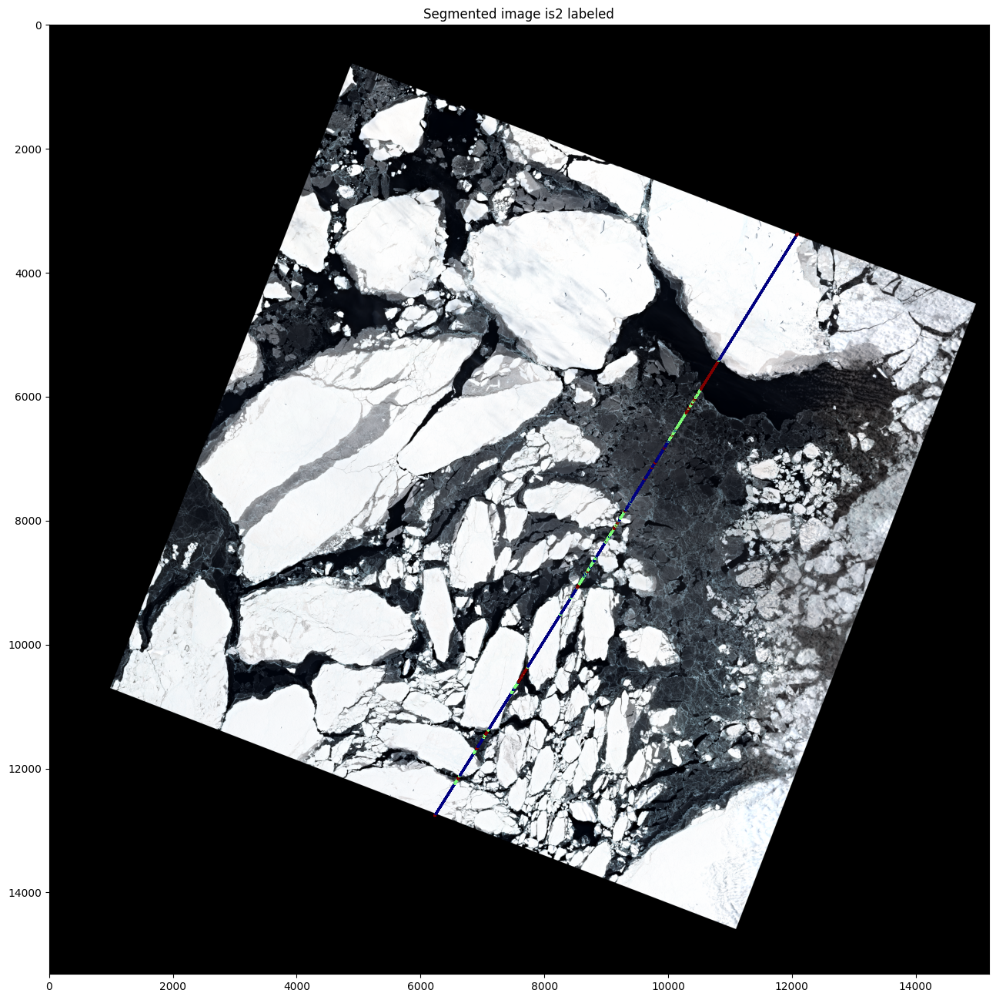

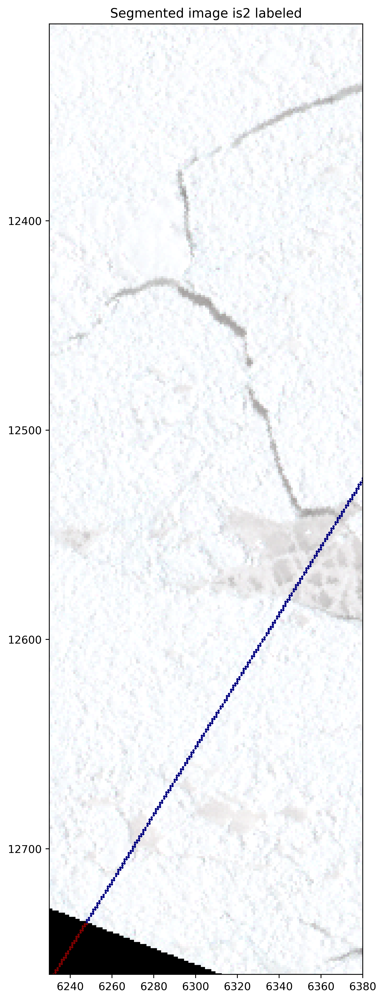

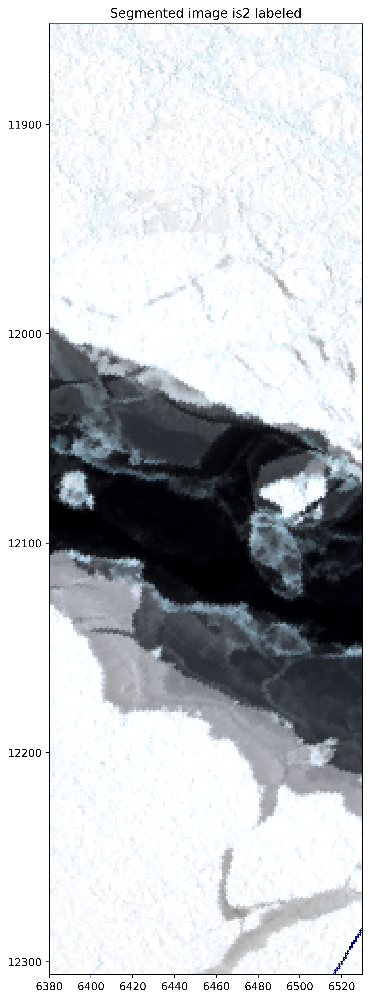

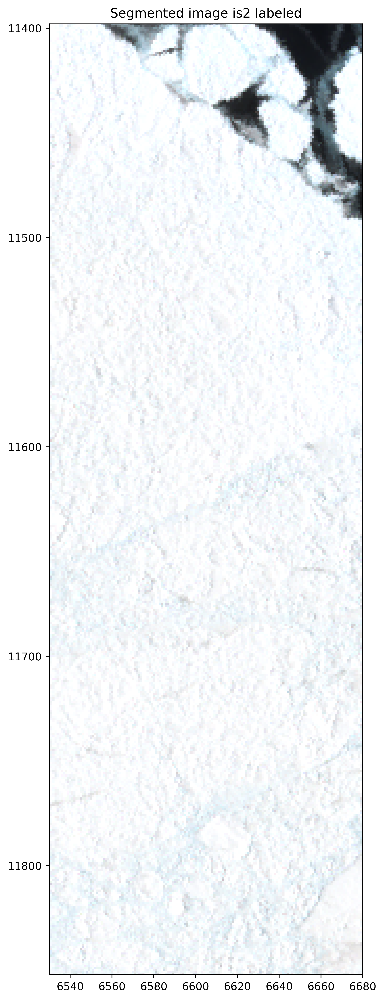

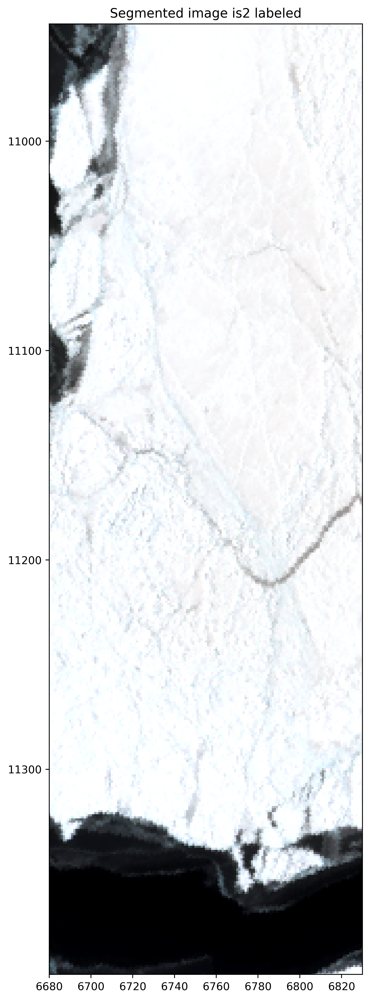

...

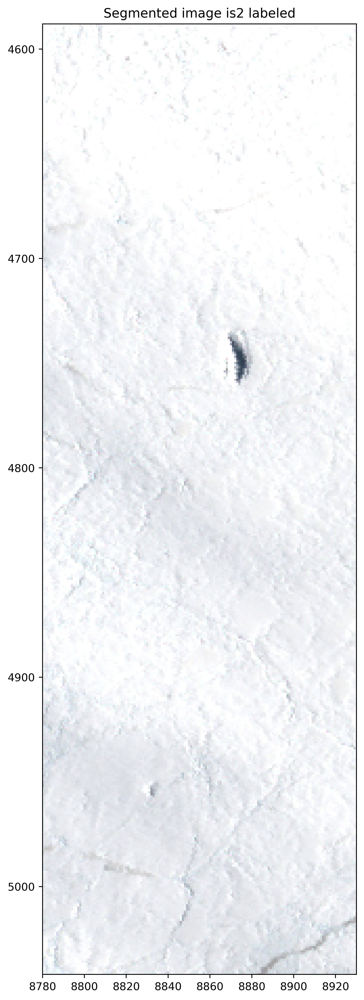

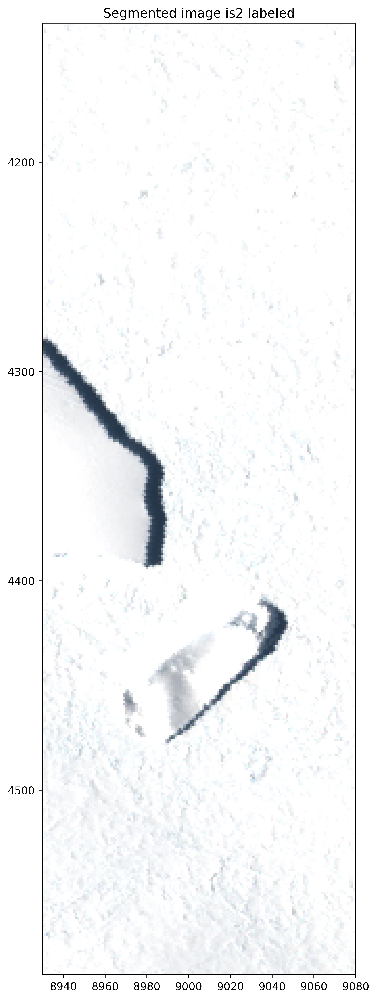

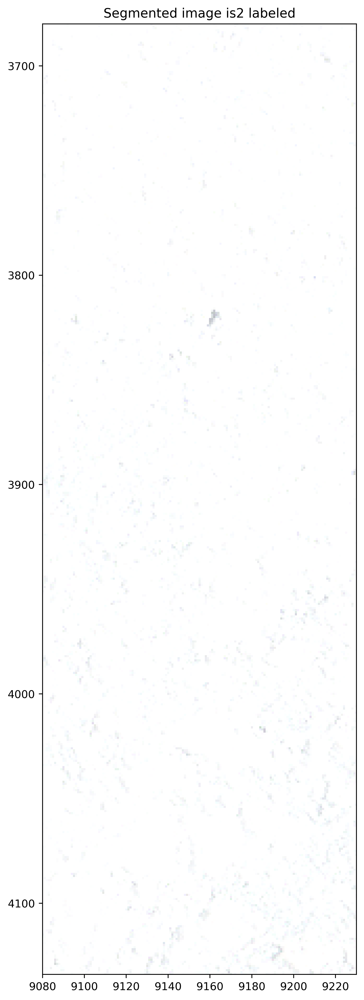

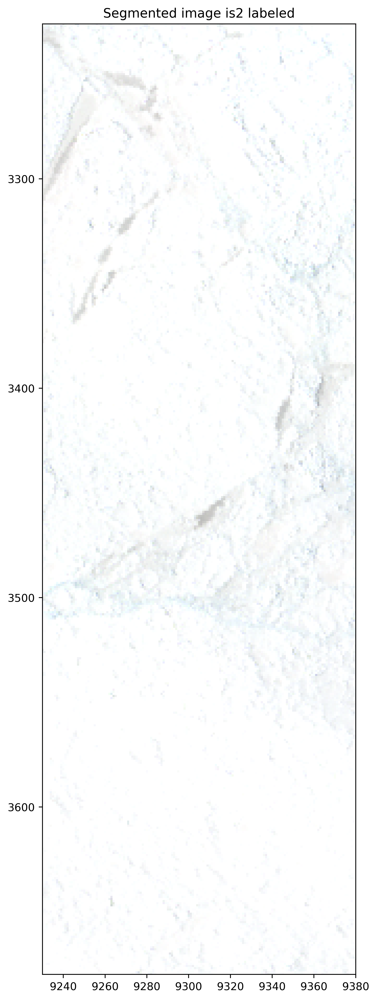

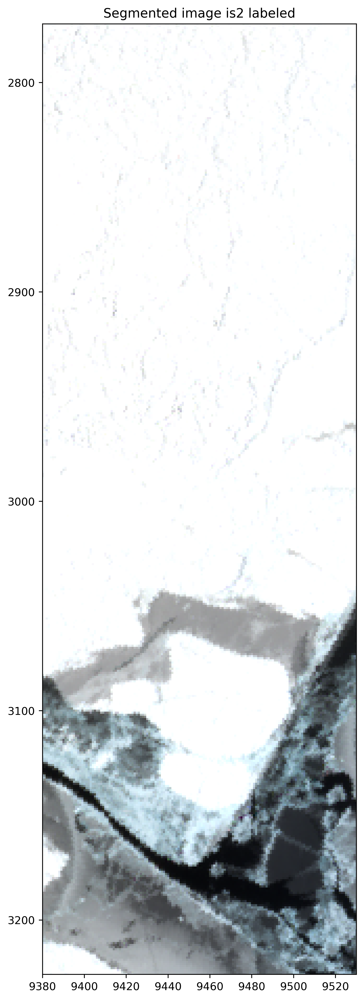

time is  352.4182620048523
labeling finished


In [10]:
from rembg import remove
import cv2
import time

# Date_list = [ 20191103, 20191104, 20191113, 20191120, 20191123, 20191126 ]

# for date in Date_list:
    
#     path_s2 = 's2_tiff/test_tiffs/'
#     filelist_s2 = sorted(glob.glob(path_s2 + "s2_vis" + "_*_" + str(date) + "*.tif"))
#     print(filelist_s2)
    
#     path_is2 = 'ATL03_labeled_data/ow_labeled_10m_5km_corrected_new_sea_surface/'
#     filelist_is2 = sorted(glob.glob(path_is2 + "ATL03_" + str(date) + "*_new_sea_surf.csv"))
#     print(filelist_is2)
    
#     break
    

file = 's2_tiff/test_tiffs/s2_vis_46_20191123T183459_20191123T183459_T04CEA.tif'
# file = 's2_tiff/test_tiffs/s2_vis_47_20191123T183459_20191123T183459_T04CEB.tif'
# file = 's2_tiff/test_tiffs/s2_vis_48_20191123T183459_20191123T183459_T04CEC.tif'
#file = 's2_tiff/test_tiffs/s2_vis_04_20191104T194529_20191104T194523_T02CNA.tif'#done
#file = 's2_tiff/test_tiffs/s2_vis_05_20191104T194529_20191104T194523_T02CNB.tif'#done
# file = 's2_tiff/test_tiffs/s2_vis_06_20191104T194529_20191104T194523_T02CNC.tif' #done
#file = 's2_tiff/test_tiffs/s2_vis_63_20191126T184459_20191126T184514_T03CWT.tif' #done

t0 = time.time()

img = rasterio.open(file, crs = 'EPSG:3976')

raw = img.read(1)
raw[raw < 0] = 0

ori = img.read()
ori[ori < 0] = 0
ori = ori.swapaxes(0,1)
ori = ori.swapaxes(1,2)

file_name = "ATL03_labeled_data/ow_labeled_by_is2trackline_10m/good/ATL03_20191123180255_08830510_T04CEA_gt3r_labeled_10m.csv"
#file_name = "ATL03_labeled_data/cor_labeled_by_is2trackline_10m/done/ATL03_20191126182014_09290510_T03CWT_gt2r_labeled_10m.csv"

print(file_name)
name = file_name[-57:]
print(name)

df_file = pd.read_csv(file_name)

print(df_file)
# df_file.to_csv("ATL03_labeled_data/cor_labeled_by_is2trackline_10m/"+name)

plt.figure(figsize = (16,16), dpi=100)
plt.imshow(cv2.cvtColor(ori, cv2.COLOR_BGR2RGB))
plt.scatter(df_file["pix_x"], df_file["pix_y"], c = df_file["label"], s=1, cmap = "jet")#cmap = plt.cm.bwr_r)
plt.title("Segmented image is2 labeled")
#plt.savefig("20191104_T02CNC_gt1r.png", dpi=300)


x1 = 6230 #5430 7688 8033
y1 = 12760 #6700 1988 2038

for i in range(22):
    plt.figure(figsize = (16,16), dpi=500)
    plt.imshow(cv2.cvtColor(ori, cv2.COLOR_BGR2RGB))
    plt.scatter(df_file["pix_x"], df_file["pix_y"], c = df_file["label"], s=1, cmap = "jet")#cmap = plt.cm.bwr_r)
    plt.title("Segmented image is2 labeled")
    # Zoom in by setting the x and y limits
    x2 = x1+150 #140
    y2 = y1-454 #420
    plt.xlim(x1, x2)    # Set x-axis limits 140
    plt.ylim(y1, y2)    # Set y-axis limits 420
    
    #df = df_file[(df_file["pix_x"] >= x1) & (df_file["pix_x"] <= x2) &
    #             (df_file['pix_y'] >= y2) & (df_file['pix_y'] <= y1) & (df_file['label'] == 1.0)]
    #print(df)
#     plt.savefig(str(i) + "_20191104_T02CNC_gt1r.png", dpi=300)
    x1 = x2
    y1 = y2
#     del df
#     if(i == 4):
#         break


plt.show()

t1 = time.time()
total = t1-t0
print("time is ", total)
    
print("labeling finished")


ATL03_labeled_data/cor_labeled_by_is2trackline_10m/ATL03_20191104195311_05940510_T02CNB_gt2r_labeled_10m_done.csv
ATL03_20191104195311_05940510_T02CNB_gt2r_labeled_10m_done.csv
       Ori_Id  year  month  day  hour  minute  second        lat         lon  \
0      125224  2019     11    4    20       0       2 -74.789350 -170.446743   
1      125225  2019     11    4    20       0       2 -74.789369 -170.446754   
2      125226  2019     11    4    20       0       2 -74.789387 -170.446765   
3      125227  2019     11    4    20       0       2 -74.789400 -170.446773   
4      125228  2019     11    4    20       0       2 -74.789419 -170.446784   
...       ...   ...    ...  ...   ...     ...     ...        ...         ...   
44865  171845  2019     11    4    20       0      16 -75.698790 -170.999675   
44866  171846  2019     11    4    20       0      16 -75.698809 -170.999687   
44867  171847  2019     11    4    20       0      16 -75.698821 -170.999695   
44868  171848  2019    

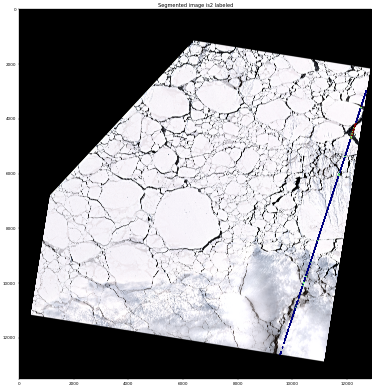

finished


In [9]:
#file = 's2_tiff/test_tiffs/s2_vis_04_20191104T194529_20191104T194523_T02CNA.tif'
#file = 's2_tiff/test_tiffs/s2_vis_05_20191104T194529_20191104T194523_T02CNB.tif'
#file = 's2_tiff/test_tiffs/s2_vis_06_20191104T194529_20191104T194523_T02CNC.tif'


img = rasterio.open(file, crs = 'EPSG:3976')
raw = img.read(1)
raw[raw < 0] = 0
ori = img.read()
ori[ori < 0] = 0
ori = ori.swapaxes(0,1)
ori = ori.swapaxes(1,2)

#file below corrected manually
file_name = "ATL03_labeled_data/cor_labeled_by_is2trackline_10m/ATL03_20191104195311_05940510_T02CNB_gt2r_labeled_10m_done.csv"
print(file_name)
name = file_name[-62:]
print(name)

df_file = pd.read_csv(file_name)
df_file = df_file.reset_index(drop=True)
df_file = df_file.loc[:, ~df_file.columns.str.contains('Unnamed.')]

print(df_file)
df_file.to_csv("ATL03_labeled_data/cor_labeled_by_is2trackline_10m/"+name)

plt.figure(figsize = (16,16), dpi=30)
plt.imshow(cv2.cvtColor(ori, cv2.COLOR_BGR2RGB))
plt.scatter(df_file["pix_x"], df_file["pix_y"], c = df_file["label"], s=1, cmap = "jet")#cmap = plt.cm.bwr_r)
plt.title("Segmented image is2 labeled")
#plt.savefig("20191104_T02CNC_gt1r.png", dpi=300)
plt.show()
    
print("finished")


ATL03_labeled_data/cor_labeled_by_is2trackline_10m/done/ATL03_20191104195311_05940510_T02CNC_gt1r_labeled_10m_done.csv
_20191104195311_05940510_T02CNC_gt1r_labeled_10m_done.csv
       Unnamed: 0  Ori_Id  year  month  day  hour  minute  second        lat  \
0               0   69057  2019     11    4    19      59      47 -73.894892   
1               1   69058  2019     11    4    19      59      47 -73.894911   
2               2   69059  2019     11    4    19      59      47 -73.894936   
3               3   69060  2019     11    4    19      59      47 -73.894948   
4               4   69061  2019     11    4    19      59      47 -73.894961   
...           ...     ...   ...    ...  ...   ...     ...     ...        ...   
39035       39035  111581  2019     11    4    20       0       3 -74.872872   
39036       39036  111582  2019     11    4    20       0       3 -74.872884   
39037       39037  111583  2019     11    4    20       0       3 -74.872897   
39038       39038  1115

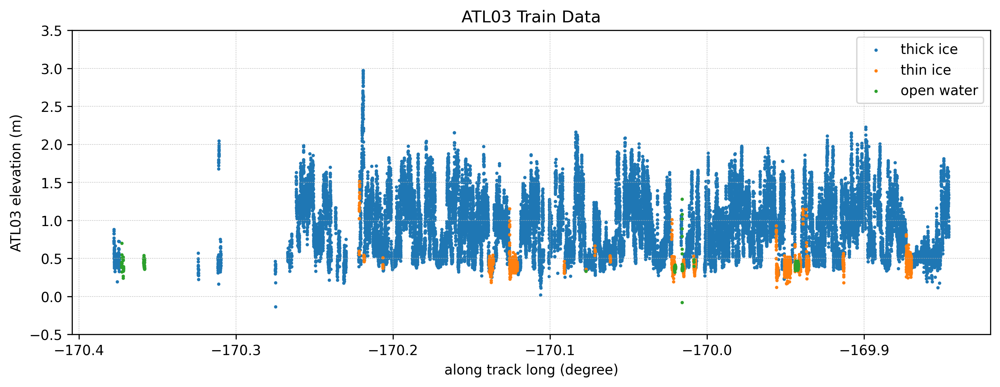

In [36]:
file_name = "ATL03_labeled_data/cor_labeled_by_is2trackline_10m/done/ATL03_20191104195311_05940510_T02CNC_gt1r_labeled_10m_done.csv"
print(file_name)
name = file_name[-57:]
print(name)

df_file = pd.read_csv(file_name)

print(df_file)

# re-extract the data
thick_ice = df_file[(df_file.label == 0)]#&(merged_data.h_cor_mean >= thinice_offset)]
thin_ice = df_file[(df_file.label == 1)]#&(merged_data.h_cor_mean >= water_offset)&(merged_data.h_cor_mean <= thinice_offset)]
water = df_file[(df_file.label == 2)]#&(merged_data.h_cor_mean <= water_offset)]


plt.figure(figsize = (12,4), dpi=300)
plt.title('ATL03 Train Data')
field = 'h_cor_mean'
plt.scatter(thick_ice.lon, thick_ice[field], s = 2, c='C0')
plt.scatter(thin_ice.lon, thin_ice[field], s = 2, c='C1')
plt.scatter(water.lon, water[field], s = 2, c='C2')
plt.grid(linestyle = ':', linewidth = 0.5)
plt.xlabel('along track long (degree)')
plt.ylabel('ATL03 elevation (m)')
plt.ylim(-0.5,3.5)
plt.legend(['thick ice', 'thin ice', 'open water'],loc='upper right')
plt.show()